### Environment Setup

In [1]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [2]:
%%capture
#to annotate frames and manage detections
!pip install -i https://test.pypi.org/simple/ supervision==0.3.0

#to load the DETR model
!pip install -q transformers

#to manage the training
!pip install -q pytorch-lightning

#to download the dataset
!pip install -q roboflow

#to load the backbone for the model
!pip install -q timm

### Simple Inference with Original Model: Quick Review

In [3]:
%cd {HOME}
!wget https://media.roboflow.com/notebooks/examples/dog.jpeg

/content
--2023-12-15 20:54:51--  https://media.roboflow.com/notebooks/examples/dog.jpeg
Resolving media.roboflow.com (media.roboflow.com)... 34.110.133.209
Connecting to media.roboflow.com (media.roboflow.com)|34.110.133.209|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 106055 (104K) [image/jpeg]
Saving to: ‘dog.jpeg’

dog.jpeg            100%[===================>] 103.57K  --.-KB/s    in 0.001s  

2023-12-15 20:54:51 (121 MB/s) - ‘dog.jpeg’ saved [106055/106055]



In [4]:
IMAGE_NAME = "dog.jpeg"
IMAGE_PATH = os.path.join(HOME, IMAGE_NAME)

In [5]:
from transformers import DetrForObjectDetection, DetrImageProcessor

CHECKPOINT = 'facebook/detr-resnet-50'
CONFIDENCE_TRESHOLD = 0.5
IOU_TRESHOLD = 0.8

image_processor = DetrImageProcessor.from_pretrained(CHECKPOINT)
model = DetrForObjectDetection.from_pretrained(CHECKPOINT)
print(model)

preprocessor_config.json:   0%|          | 0.00/274 [00:00<?, ?B/s]

The `max_size` parameter is deprecated and will be removed in v4.26. Please specify in `size['longest_edge'] instead`.


config.json:   0%|          | 0.00/4.59k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/167M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


DetrForObjectDetection(
  (model): DetrModel(
    (backbone): DetrConvModel(
      (conv_encoder): DetrConvEncoder(
        (model): FeatureListNet(
          (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
          (bn1): DetrFrozenBatchNorm2d()
          (act1): ReLU(inplace=True)
          (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
          (layer1): Sequential(
            (0): Bottleneck(
              (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn1): DetrFrozenBatchNorm2d()
              (act1): ReLU(inplace=True)
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): DetrFrozenBatchNorm2d()
              (drop_block): Identity()
              (act2): ReLU(inplace=True)
              (aa): Identity()
              (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      

In [6]:
import cv2
import torch
import supervision as sv

with torch.no_grad():

  #load image and predict
  image = cv2.imread(IMAGE_PATH)
  inputs = image_processor(images=image, return_tensors='pt')
  outputs = model(**inputs)

  #post-process
  target_sizes = torch.tensor([image.shape[:2]])
  results = image_processor.post_process_object_detection(outputs=outputs,
                                                        threshold=CONFIDENCE_TRESHOLD,
                                                        target_sizes=target_sizes)[0]

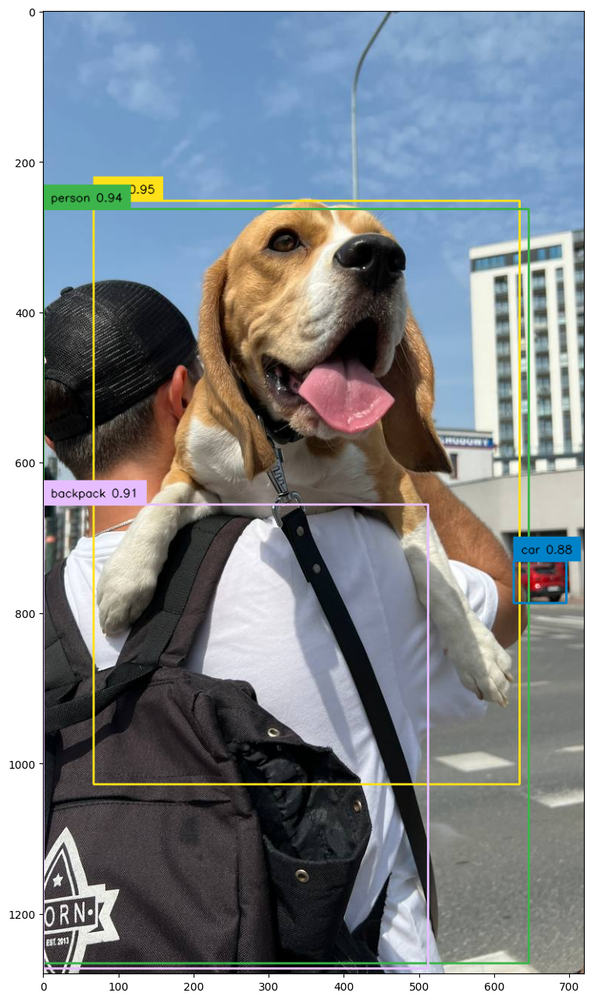

In [7]:
#annotations
detections = sv.Detections.from_transformers(transformers_results=results).with_nms(threshold=IOU_TRESHOLD)

labels = [f"{model.config.id2label[class_id]} {confidence:0.2f}" for _, confidence, class_id, _ in detections]

box_annotator = sv.BoxAnnotator()

frame = box_annotator.annotate(scene=image, detections=detections, labels=labels)

%matplotlib inline
sv.show_frame_in_notebook(frame, (16, 16))

### Downloading the Dataset from Roboflow

In [8]:
from getpass import getpass

ROBOFLOW_API_KEY = getpass('Enter the secret value: ')

Enter the secret value: ··········


In [9]:
!mkdir {HOME}/dataset
%cd {HOME}/dataset

from roboflow import Roboflow
rf = Roboflow(api_key=ROBOFLOW_API_KEY)
project = rf.workspace("mohamed-ahmed-cgrlk").project("car-models-yrkry")
dataset = project.version(2).download("coco")


/content/dataset
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Car-Models-2 in coco:: 100%|██████████| 3496/3496 [00:01<00:00, 3460.00it/s]


In [10]:
dataset.location

'/content/dataset/Car-Models-2'

### COCO Data Loaders

In [11]:
import torchvision

#settings
ANNOTATION_FILE_NAME = '_annotations.coco.json'
TRAIN_DIRECTORY = os.path.join(dataset.location, 'train')
VAL_DIRECTORY = os.path.join(dataset.location, 'valid')
TEST_DIRECTORY = os.path.join(dataset.location, 'test')

class CocoDetection(torchvision.datasets.CocoDetection):
  def __init__(self, image_directory_path: str, image_processor, train: bool=True):
    annotation_file_path = os.path.join(image_directory_path, ANNOTATION_FILE_NAME)
    super(CocoDetection, self).__init__(image_directory_path, annotation_file_path)
    self.image_processor = image_processor

  def __getitem__(self, idx):
    images, annotations = super(CocoDetection, self).__getitem__(idx)
    image_id = self.ids[idx]
    annotations = {'image_id': image_id, 'annotations': annotations}
    encoding = self.image_processor(images=images, annotations=annotations, return_tensors='pt')
    pixel_values = encoding['pixel_values'].squeeze()
    target = encoding['labels'][0]

    return pixel_values, target

In [12]:
TRAIN_DATASET = CocoDetection(image_directory_path=TRAIN_DIRECTORY, image_processor=image_processor, train=True)

VAL_DATASET = CocoDetection(image_directory_path=VAL_DIRECTORY, image_processor=image_processor, train=False)

TEST_DATASET = CocoDetection(image_directory_path=TEST_DIRECTORY, image_processor=image_processor, train=False)

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [13]:
#just to check...
print("Number of training examples:", len(TRAIN_DATASET))
print("Number of validation examples:", len(VAL_DATASET))
print("Number of test examples:", len(TEST_DATASET))

Number of training examples: 2632
Number of validation examples: 599
Number of test examples: 257


### Checking the Images and Annotations

Image #914


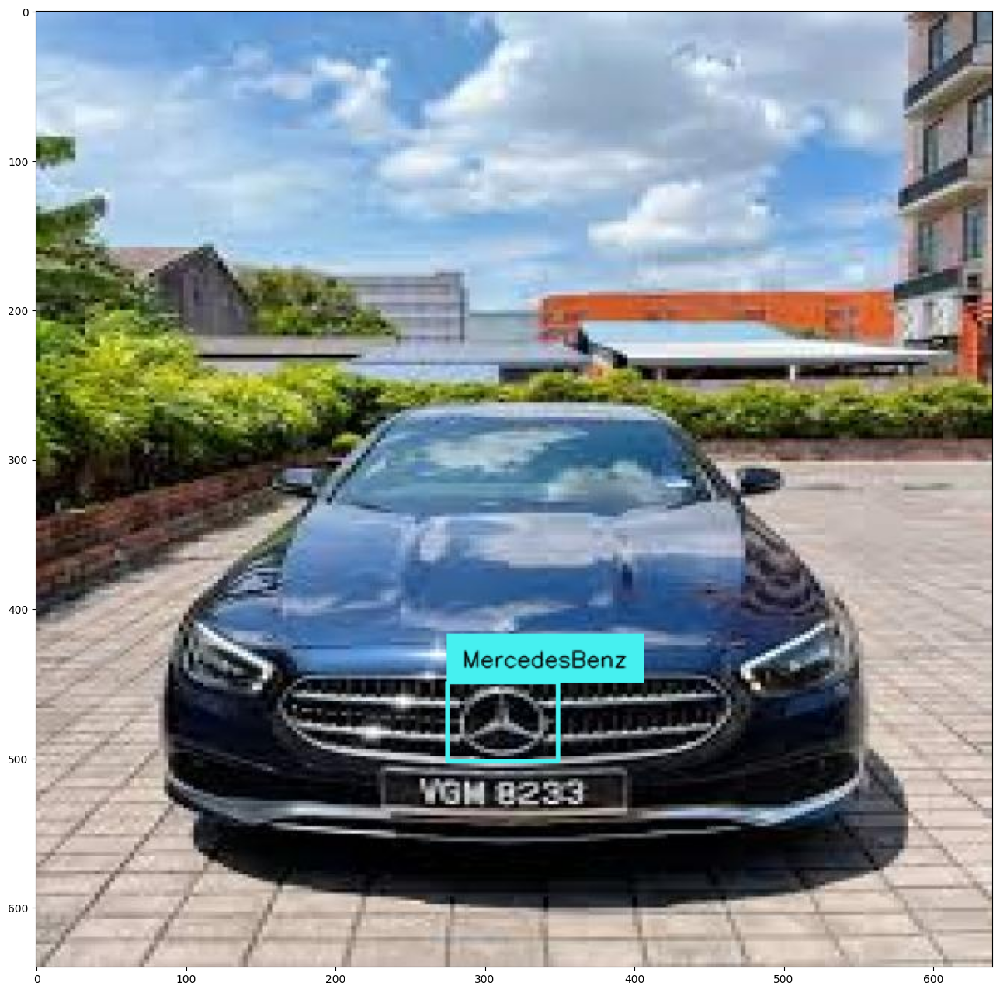

In [14]:
import random
import numpy as np

#select random id
image_ids = TRAIN_DATASET.coco.getImgIds()
image_id = random.choice(image_ids)
print(f'Image #{image_id}')

#load image and annotations
image = TRAIN_DATASET.coco.loadImgs(image_id)[0]
annotations = TRAIN_DATASET.coco.imgToAnns[image_id]
image_path = os.path.join(TRAIN_DIRECTORY, image['file_name'])
image = cv2.imread(image_path)

#annotations
detections = sv.Detections.from_coco_annotations(coco_annotation=annotations)

#id2label function for training
categories = TRAIN_DATASET.coco.cats
id2label = {k: v['name'] for k, v in categories.items()}

labels = [f'{id2label[class_id]}' for _, _, class_id, _ in detections]

box_annotator = sv.BoxAnnotator()

frame = box_annotator.annotate(scene=image, detections=detections, labels=labels)

%matplotlib inline
sv.show_frame_in_notebook(image, (16, 16))

### Collate Function

In [15]:
from torch.utils.data import DataLoader

def collate_fn(batch):
  pixel_values = [item[0] for item in batch]
  encoding = image_processor.pad(pixel_values, return_tensors='pt')
  labels = [item[1] for item in batch]

  return {'pixel_values': encoding['pixel_values'],
          'pixel_mask': encoding['pixel_mask'],
          'labels': labels}

In [16]:
TRAIN_DATALOADER = DataLoader(dataset=TRAIN_DATASET, collate_fn=collate_fn, batch_size=4, shuffle=True)

VAL_DATALOADER = DataLoader(dataset=VAL_DATASET, collate_fn=collate_fn, batch_size=4)

TEST_DATALOADER = DataLoader(dataset=TEST_DATASET, collate_fn=collate_fn, batch_size=4)

### Custom PyTorch Lightning

In [17]:
import pytorch_lightning as pl

class Detr(pl.LightningModule):
  def __init__(self, lr, lr_backbone, weight_decay):
    super().__init__()
    self.model = DetrForObjectDetection.from_pretrained(pretrained_model_name_or_path=CHECKPOINT,
                                                        num_labels=len(id2label),
                                                        ignore_mismatched_sizes=True)
    self.lr = lr
    self.lr_backbone = lr_backbone
    self.weight_decay = weight_decay

  def forward(self, pixel_values, pixel_mask):
    return self.model(pixel_values=pixel_values, pixel_mask=pixel_mask)

  def common_step(self, batch, batch_idx):
    pixel_values = batch['pixel_values']
    pixel_mask = batch['pixel_mask']
    labels = [{k: v.to(self.device) for k, v in t.items()} for t in batch['labels']]

    outputs = self.model(pixel_values=pixel_values, pixel_mask=pixel_mask, labels=labels)

    loss = outputs.loss
    loss_dict = outputs.loss_dict

    return loss, loss_dict

  def training_step(self, batch, batch_idx):
    loss, loss_dict = self.common_step(batch, batch_idx)

    #logs metrics for each training_step, and the average across the epochs
    self.log('training_loss', loss)
    for k, v in loss_dict.items():
      self.log('train_'+ k, v.item())

    return loss

  def validation_step(self, batch, batch_idx):
    loss, loss_dict = self.common_step(batch, batch_idx)

    #logs metrics for each validation_step, and the average across the epochs
    self.log('validation_loss', loss)
    for k, v in loss_dict.items():
      self.log('validation_'+ k, v.item())

    return loss

  def configure_optimizers(self):
    param_dicts = [{'params': [p for n, p in self.named_parameters() if 'backbone' not in n and p.requires_grad]},
                   {'params': [p for n, p in self.named_parameters() if 'backbone' in n and p.requires_grad], 'lr': self.lr_backbone}]

    return torch.optim.AdamW(param_dicts, lr=self.lr, weight_decay=self.weight_decay)

  def train_dataloader(self):
    return TRAIN_DATALOADER

  def val_dataloader(self):
    return VAL_DATALOADER


### TensorBoard

In [18]:
%cd {HOME}
%load_ext tensorboard
%tensorboard --logdir lightning_logs/

/content


<IPython.core.display.Javascript object>

In [19]:
model = Detr(lr=1e-4, lr_backbone=1e-5, weight_decay=1e-4)

batch = next(iter(TRAIN_DATALOADER))

outputs = model(pixel_values=batch['pixel_values'], pixel_mask=batch['pixel_mask'])

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DetrForObjectDetection were not initialized from the model checkpoin

In [20]:
outputs.logits.shape

torch.Size([4, 100, 11])

### Trainer

In [21]:
from pytorch_lightning import Trainer

%cd {HOME}

MAX_EPOCHS = 30

trainer = Trainer(max_epochs=MAX_EPOCHS, gradient_clip_val=0.1, accumulate_grad_batches=8, log_every_n_steps=5)

trainer.fit(model)

/content


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                   | Params
-------------------------------------------------
0 | model | DetrForObjectDetection | 41.5 M
-------------------------------------------------
41.3 M    Trainable params
222 K     Non-trainable params
41.5 M    Total params
166.016   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=1` in the `DataLoader` to improve performance.
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/utilities/data.py:77: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 4. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=1` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/utilities/data.py:77: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 3. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=30` reached.


### Inference on Test Dataset

#### True Image

Image #85
True Image


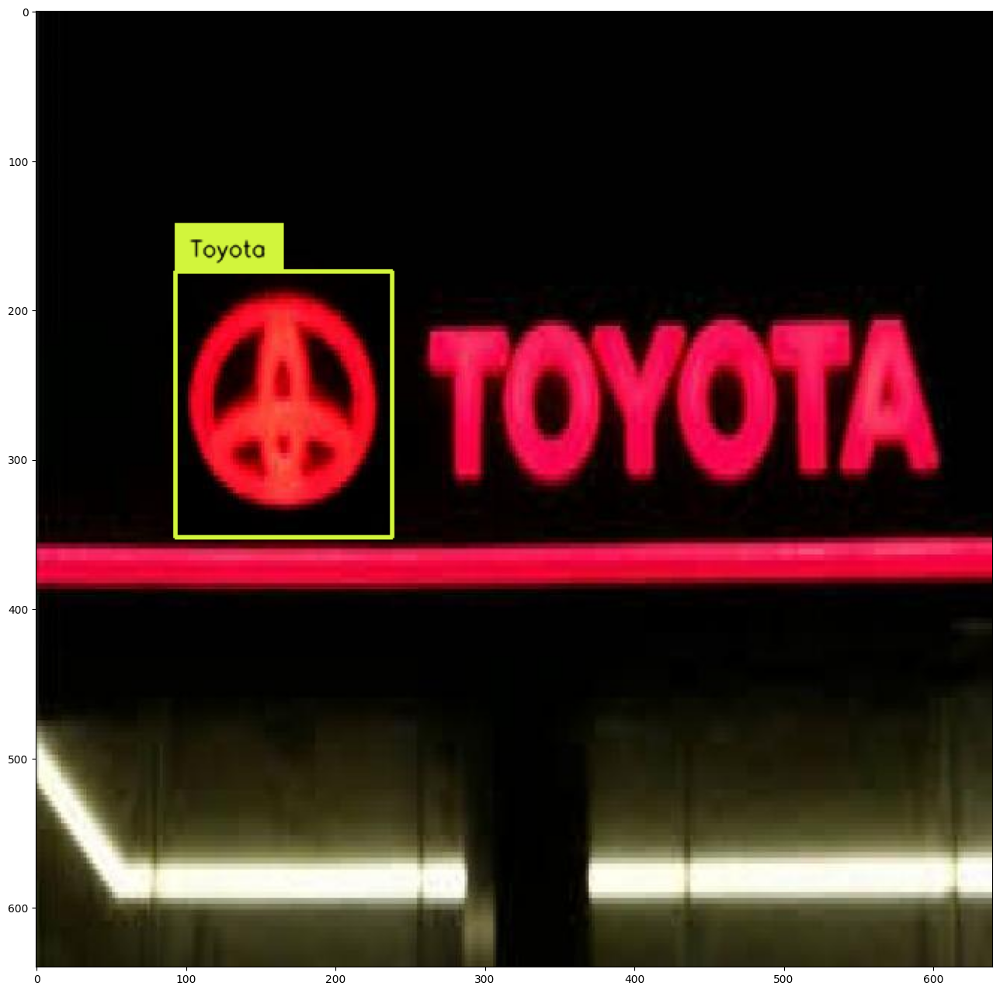

In [32]:
#utils
categories = TRAIN_DATASET.coco.cats
id2label = {k: v['name'] for k, v in categories.items()}
box_annotator = sv.BoxAnnotator()

#select random image from test dataset
image_ids = TRAIN_DATASET.coco.getImgIds()
image_id = random.choice(image_ids)
print(f'Image #{image_id}')

#load image and annotations
image = TRAIN_DATASET.coco.loadImgs(image_id)[0]
annotations = TRAIN_DATASET.coco.imgToAnns[image_id]
image_path = os.path.join(TRAIN_DATASET.root, image['file_name'])
image = cv2.imread(image_path)

#annotations
detections = sv.Detections.from_coco_annotations(coco_annotation=annotations)
labels = [f'{id2label[class_id]}' for _, _, class_id, _ in detections]
frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)

print('True Image')
%matplotlib inline
sv.show_frame_in_notebook(frame, (16, 16))

Image #12
True Image


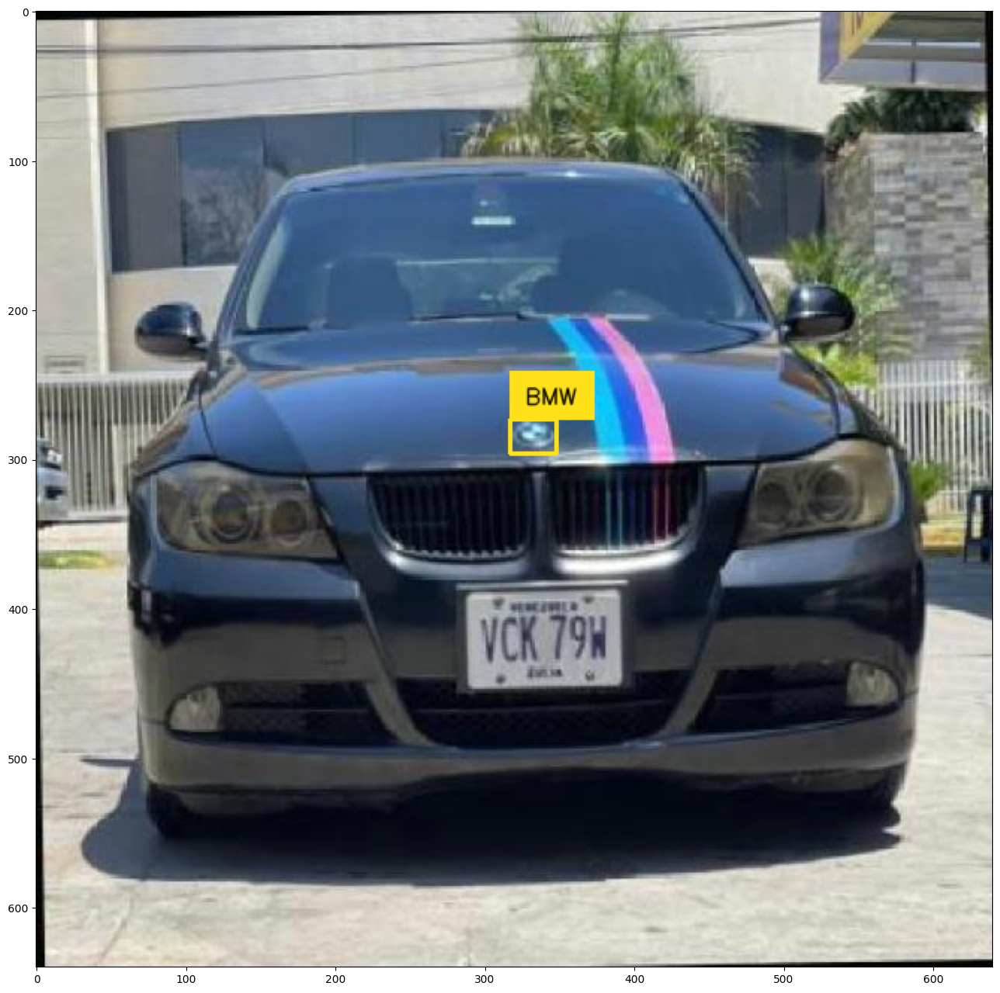

In [72]:
#utils
categories = TEST_DATASET.coco.cats
id2label = {k: v['name'] for k, v in categories.items()}
box_annotator = sv.BoxAnnotator()

#select random image from test dataset
image_ids = TEST_DATASET.coco.getImgIds()
image_id = random.choice(image_ids)
print(f'Image #{image_id}')

#load image and annotations
image = TEST_DATASET.coco.loadImgs(image_id)[0]
annotations = TEST_DATASET.coco.imgToAnns[image_id]
image_path = os.path.join(TEST_DATASET.root, image['file_name'])
image = cv2.imread(image_path)

#annotations
detections = sv.Detections.from_coco_annotations(coco_annotation=annotations)
labels = [f'{id2label[class_id]}' for _, _, class_id, _ in detections]
frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)

print('True Image')
%matplotlib inline
sv.show_frame_in_notebook(frame, (16, 16))

#### Inference Image

Detections


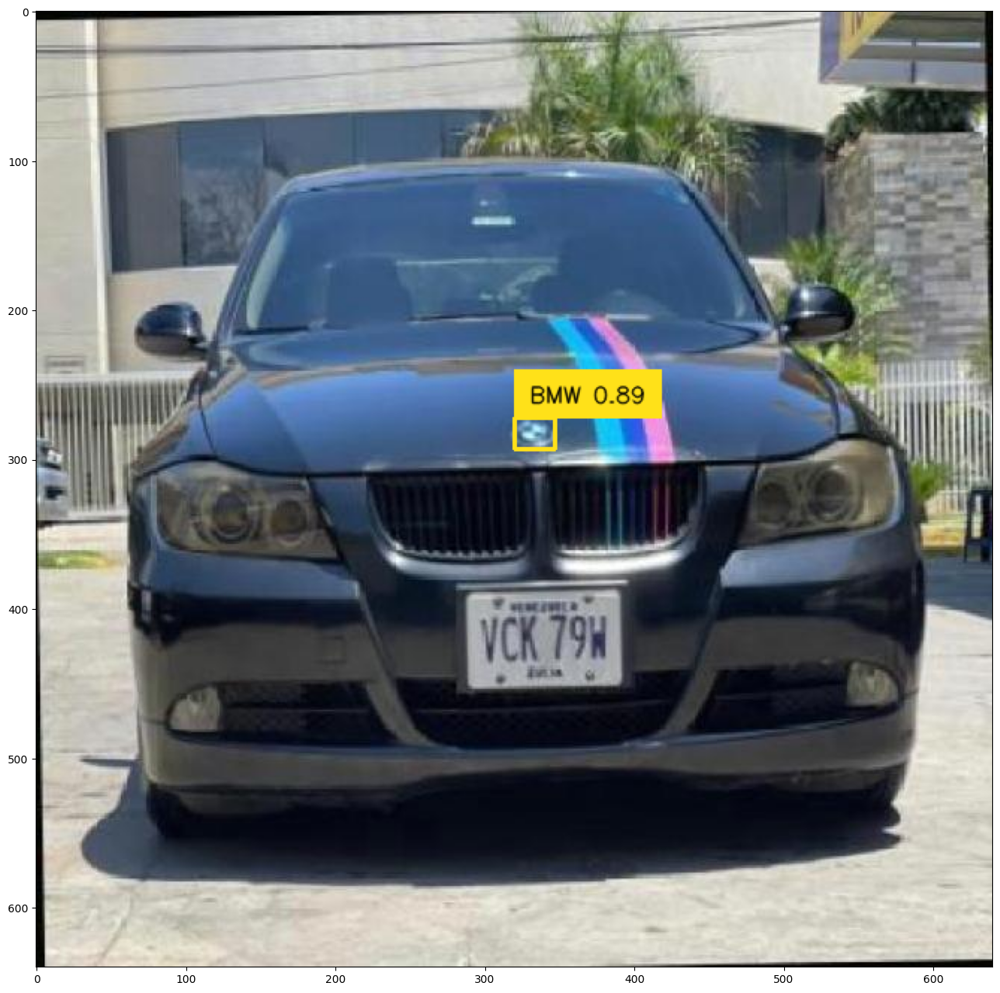

In [73]:
with torch.no_grad():

  #load image and predict
  inputs = image_processor(images=image, return_tensors='pt')
  outputs = model(**inputs)

  #post-process
  target_sizes = torch.tensor([image.shape[:2]])
  results = image_processor.post_process_object_detection(outputs=outputs, threshold=0.25, target_sizes=target_sizes)[0]

#annotations
detections = sv.Detections.from_transformers(transformers_results=results)
labels = [f'{id2label[class_id]} {confidence:.2f}' for _, confidence, class_id, _ in detections]
frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)

print('Detections')
%matplotlib inline
sv.show_frame_in_notebook(frame, (16, 16))

### Evaluation on Test Dataset

In [25]:
%%capture
!pip install -q coco_eval

In [26]:
def convert_to_xywh(boxes):
  xmin, ymin, xmax, ymax = boxes.unbind(1)

  return torch.stack((xmin, ymin, xmax - xmin, ymax - ymin), dim=1)

def prepare_for_coco_detection(predictions):
  coco_results = []
  for original_id, prediction in predictions.items():
    if len(prediction) == 0:
      continue
    boxes = prediction['boxes']
    boxes = convert_to_xywh(boxes).tolist()
    scores = prediction['scores'].tolist()
    labels = prediction['labels'].tolist()

    coco_results.extend([{'image_id': original_id,
                          'category_id': labels[k],
                          'bbox': box,
                          'score': scores[k],} for k, box in enumerate(boxes)])

    return coco_results

In [27]:
from coco_eval import CocoEvaluator
from tqdm.notebook import tqdm

evaluator = CocoEvaluator(coco_gt=TEST_DATASET.coco, iou_types=['bbox'])

print('Running Evaluation...')

for idx, batch in enumerate(tqdm(TEST_DATALOADER)):
  pixel_values = batch['pixel_values']
  pixel_mask = batch['pixel_mask']
  labels = [{k: v for k, v in t.items()} for t in batch['labels']]

  with torch.no_grad():
    outputs = model(pixel_values=pixel_values, pixel_mask=pixel_mask)

  orig_target_sizes = torch.stack([target['orig_size'] for target in labels], dim=0)
  results = image_processor.post_process_object_detection(outputs, target_sizes=orig_target_sizes, threshold=0)

  predictions = {target['image_id'].item(): output for target, output in zip(labels, results)}
  predictions = prepare_for_coco_detection(predictions)
  print(predictions)
  evaluator.update(predictions)

evaluator.synchronize_between_processes()
evaluator.accumulate()
evaluator.summarize()


Running Evaluation...


  0%|          | 0/65 [00:00<?, ?it/s]

[{'image_id': 0, 'category_id': 4, 'bbox': [60.454959869384766, 169.92596435546875, 513.8187255859375, 423.9515380859375], 'score': 0.000564543588552624}, {'image_id': 0, 'category_id': 4, 'bbox': [333.5303039550781, 300.91845703125, 16.660614013671875, 19.704345703125], 'score': 0.007871928624808788}, {'image_id': 0, 'category_id': 4, 'bbox': [266.318603515625, 262.8670654296875, 117.84649658203125, 94.02426147460938], 'score': 0.0003537885786499828}, {'image_id': 0, 'category_id': 4, 'bbox': [307.92791748046875, 286.1156311035156, 72.78277587890625, 127.51406860351562], 'score': 0.0011703120544552803}, {'image_id': 0, 'category_id': 4, 'bbox': [269.6878662109375, 267.7629699707031, 91.27642822265625, 77.72760009765625], 'score': 0.0010019534965977073}, {'image_id': 0, 'category_id': 4, 'bbox': [295.0716552734375, 274.3388671875, 87.24005126953125, 87.01626586914062], 'score': 0.02182302437722683}, {'image_id': 0, 'category_id': 4, 'bbox': [313.84527587890625, 278.76568603515625, 40.9

In [28]:
MODEL_PATH = os.path.join(HOME, 'logo_detection_model')

model.model.save_pretrained(MODEL_PATH)

model = DetrForObjectDetection.from_pretrained(MODEL_PATH)

model

DetrForObjectDetection(
  (model): DetrModel(
    (backbone): DetrConvModel(
      (conv_encoder): DetrConvEncoder(
        (model): FeatureListNet(
          (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
          (bn1): DetrFrozenBatchNorm2d()
          (act1): ReLU(inplace=True)
          (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
          (layer1): Sequential(
            (0): Bottleneck(
              (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn1): DetrFrozenBatchNorm2d()
              (act1): ReLU(inplace=True)
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): DetrFrozenBatchNorm2d()
              (drop_block): Identity()
              (act2): ReLU(inplace=True)
              (aa): Identity()
              (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      